# Prepare Ross Ice Shelf gravity data

import the necessary packages

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext snakeviz
from antarctic_plots import fetch, regions, utils, maps
import pygmt
import numpy as np
import pandas as pd
import numpy as np
from scipy import stats
import geopandas as gpd
import xarray as xr
import rioxarray
import verde as vd
import harmonica as hm
import damp
from pyproj import Transformer
import os
import zarr
import math
import scipy
import warnings
from tqdm.auto import tqdm
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from RIS_gravity_inversion import gravity_processing as grav
from RIS_gravity_inversion import utils as inv_utils
os.getcwd()

'/Users/home/tankerma/RIS_gravity_inversion/notebooks'

# ROSETTA-Ice data

## load data
with antarctic_plots.fetch

                line       LATITUDE      LONGITUDE      unixtime  \
count  398279.000000  398279.000000  398279.000000  3.982790e+05   
mean      661.219550     -80.571198     -36.741857  1.457515e+09   
std       264.422153       1.786949     165.241996  1.431469e+07   
min        20.000000     -85.389220    -179.999880  1.447367e+09   
25%       470.000000     -81.869075    -169.885715  1.448316e+09   
50%       650.000000     -80.392556    -158.359371  1.449134e+09   
75%       840.000000     -79.145016     171.037900  1.479949e+09   
max      1140.000000     -77.339971     180.000724  1.480734e+09   

              Height        easting      northing  FAG_levelled  
count  398279.000000  398279.000000  3.982790e+05  3.982790e+05  
mean      793.056619  -84278.810943 -1.000705e+06  4.329633e-15  
std        83.977581  212966.781186  1.984653e+05  1.425479e+01  
min       650.023000 -571781.809097 -1.367767e+06 -2.854953e+02  
25%       744.524000 -240585.860838 -1.160510e+06 -7.3644

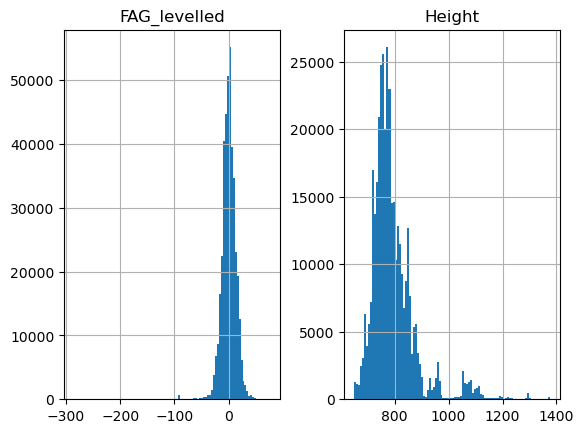

In [2]:
rosetta = fetch.ROSETTA_gravity()

# set standard column names
rosetta = rosetta.rename(columns={"Line":"line", "x":"easting", "y":"northing"})

rosetta = gpd.GeoDataFrame(
    rosetta, 
    geometry=gpd.points_from_xy(x=rosetta.easting, y=rosetta.northing),
)
    
rosetta[["FAG_levelled", "Height"]].hist(bins=100)
print(rosetta.describe())

In [3]:
# seperate e-w flight lines from n-s tie lines
ties = rosetta[rosetta.line >= 1000]
lines = rosetta[rosetta.line < 1000]

Plot as point data

In [4]:
# get bounding region of data
# region = vd.get_region((rosetta.x, rosetta.y))
# # zoom out by 20 km
# region = utils.alter_region(region, zoom=-40e3)[0]
# # round to nearest 5km
# region = round_region(region, 5e3)
# region
region = (-620000.0, 460000.0, -1460000.0, -380000.0)

In [5]:
# # plot a basemap
# fig = maps.basemap(
#     region,
#     title="ROSETTA-Ice gravity data",
#     background="black",
# )

# # get a quarter of max absolute value and make a colorscale
# maxabs = vd.maxabs(rosetta.FAG_levelled) * 0.25
# pygmt.makecpt(cmap="roma", series=[-maxabs, maxabs])

# # plot gravity data
# fig.plot(x=rosetta.easting, y=rosetta.northing, color=rosetta.FAG_levelled, style="c2p", cmap=True)

# grav.plot_flightlines(fig, lines, plot_lines=False, direction="EW")

# grav.plot_flightlines(fig, lines, plot_lines=False, direction="NS")

# # plot the colorbar
# fig.colorbar(frame='af+l"free air gravity [mGal]"')

# # add a second figure to the right
# fig = maps.basemap(
#     region,
#     title="ROSETTA-Ice flight elevations",
#     origin_shift="xshift",
#     fig=fig,
#     background="black",
# )

# # make a colorscale for flight elevations
# pygmt.makecpt(cmap="thermal", series=[rosetta.Height.min(), rosetta.Height.max()])

# # plot flight elevation data
# fig.plot(x=rosetta.easting, y=rosetta.northing, color=rosetta.Height, style="c2p", cmap=True)

# grav.plot_flightlines(fig, lines, plot_lines=False, direction="EW")
# grav.plot_flightlines(fig, ties, plot_lines=False, direction="NS")

# # plot the colorbar
# fig.colorbar(frame='af+l"flight elevation [m]"')

# fig.show()

# Intersections
create an intersections dataframe between all lines

In [6]:
inters_no_cutoff = grav.create_intersection_table(
    rosetta,
    # cutoff_dist = 10e3,
    plot=False
)

In [5]:
# !!! ONLY MAKES INTERSECTION WITHIN LINE, IF REAL INT IS JUST OUTSIDE END OF LINE
# IT WON'T COUNT. SHOULD BUFFER LINES BY DISTANCE.
inters = grav.create_intersection_table(
    rosetta,
    cutoff_dist = 10e3,
    plot=False
)
inters.describe()

removed 12 intersections points which were further than 10km from nearest data point


,line1,line2,max_dist,easting,northing
count,428.000000,428.000000,428.000000,428.000000,4.280000e+02
mean,566.217290,1065.490654,166.733474,-81725.235280,-1.006734e+06
std,196.525176,32.187862,937.308193,183221.639634,1.965847e+05
min,50.000000,1000.000000,1.085047,-470283.712183,-1.350705e+06
25%,410.000000,1040.000000,25.012265,-218370.778345,-1.160520e+06
50%,570.000000,1070.000000,34.260585,-53408.673096,-1.010501e+06
75%,720.000000,1090.000000,42.033589,56631.054975,-8.504427e+05
max,910.000000,1140.000000,8539.904076,331840.937091,-4.903223e+05


In [6]:
# add empty row to 
rosetta, inters = grav.add_intersections(rosetta, inters)
rosetta[rosetta.is_intersection]

,line,LATITUDE,LONGITUDE,unixtime,Height,easting,northing,FAG_levelled,geometry,is_intersection,intersecting_line,dist_along_line
2234,50.0,NaN,NaN,NaN,NaN,-218366.620807,-4.903223e+05,NaN,POINT (-218366.621 -490322.266),True,1040.0,75298.725128
3614,80.0,NaN,NaN,NaN,NaN,-218370.298672,-5.204792e+05,NaN,POINT (-218370.299 -520479.220),True,1040.0,66357.166666
4467,110.0,NaN,NaN,NaN,NaN,-218370.463581,-5.503800e+05,NaN,POINT (-218370.464 -550380.002),True,1040.0,26674.343360
5011,110.0,NaN,NaN,NaN,NaN,-163372.861101,-5.504074e+05,NaN,POINT (-163372.861 -550407.441),True,1050.0,81671.935836
6158,140.0,NaN,NaN,NaN,NaN,-163395.215124,-5.804055e+05,NaN,POINT (-163395.215 -580405.511),True,1050.0,61421.050783
...,...,...,...,...,...,...,...,...,...,...,...,...
397707,1140.0,NaN,NaN,NaN,NaN,331826.687432,-1.100608e+06,NaN,POINT (331826.687 -1100607.570),True,660.0,74254.443110
398036,1140.0,NaN,NaN,NaN,NaN,331826.259411,-1.070505e+06,NaN,POINT (331826.259 -1070504.518),True,630.0,104357.487900
398253,1140.0,NaN,NaN,NaN,NaN,331840.937091,-1.050564e+06,NaN,POINT (331840.937 -1050563.819),True,610.0,124298.192629
398364,1140.0,NaN,NaN,NaN,NaN,331832.763929,-1.040655e+06,NaN,POINT (331832.764 -1040655.063),True,600.0,134206.942814


In [7]:
inters.describe()

,line1,line2,max_dist,easting,northing,dist_along_line1,dist_along_line2
count,428.000000,428.000000,428.000000,428.000000,4.280000e+02,428.000000,428.000000
mean,566.217290,1065.490654,166.733474,-81725.235280,-1.006734e+06,330703.067399,336037.373977
std,196.525176,32.187862,937.308193,183221.639634,1.965847e+05,204679.466294,198454.467389
min,50.000000,1000.000000,1.085047,-470283.712183,-1.350705e+06,228.712147,5833.870752
25%,410.000000,1040.000000,25.012265,-218370.778345,-1.160520e+06,167202.828280,167131.358951
50%,570.000000,1070.000000,34.260585,-53408.673096,-1.010501e+06,311103.104934,323729.138334
75%,720.000000,1090.000000,42.033589,56631.054975,-8.504427e+05,476045.024895,488515.820436
max,910.000000,1140.000000,8539.904076,331840.937091,-4.903223e+05,878331.819658,788437.927565


In [ ]:
grav.plotly_points(
    rosetta,
    color_col="FAG_levelled",
    hover_cols=["line", "dist_along_line", "unixtime"],
    robust=True,
    # point_size=5,
)

In [11]:
# grav.plotly_points(
#     rosetta[rosetta.line>=1000],
#     color_col="dist_along_line",
#     hover_cols=["line", "dist_along_line", "unixtime"],
#     robust=True,
#     point_size=5,
# )

In [12]:
# grav.plotly_points(
#     rosetta[rosetta.line<1000],
#     color_col="dist_along_line",
#     hover_cols=["line", "dist_along_line", "unixtime"],
#     robust=True,
# )

In [13]:
# x = grav.interp1d(
#     rosetta[rosetta.line.isin([1000])],
#     to_interp=["FAG_levelled", "Height"],
    
#     # interp_on=["x","y"],
#     # engine="verde",
#     # method=vd.Spline(),
    
#     interp_on="dist_along_line",
#     engine="scipy",
#     method="cubic",
    
#     # plot_line=True,
# )

# # x[x.is_intersection]

In [14]:
# x = grav.interp1d_windows(
#     rosetta[rosetta.line.isin([1000])],
#     to_interp=["FAG_levelled", "Height"],
    
#     window_width = 1e3,
    
#     # interp_on=["x","y"],
#     # engine="verde",
#     # method=vd.Spline(),
    
#     interp_on="dist_along_line",
#     engine="scipy",
#     method="cubic",
    
#     # plot_windows=True,
#     # plot_line=True,
# )

# # x[x.is_intersection]

## Interpolate data at intersections

In [8]:
rosetta = grav.interp1d_all_lines(
    rosetta,
    # rosetta[rosetta.line.isin(lines_with_elev_issues)],
    # rosetta[rosetta.line.between(1080, 1100)],
    # rosetta[rosetta.line==630],
    to_interp=["FAG_levelled", "Height"],
    
    window_width = 5e3,
    
    # interp_on=["x","y"],
    # engine="verde",
    # method=vd.Spline(),
    
    interp_on="dist_along_line",
    engine="scipy",
    method="cubic",
    
    # plot=True,
    # wait_for_input=True,
)

too few points in window for intersection of lines 1100.0 & 430.0, doubling window size to 10.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 20.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 40.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 80.0km
too few points in window for intersection of lines 1100.0 & 430.0, doubling window size to 10.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 20.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 40.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 80.0km
too few points in window for intersection of lines 1000.0 & 510.0, doubling window size to 10.0km
bounds error for iterpolation of intersection of lines 1000.0 & 510.0, doubling window size to

## Manually check and clean data

In [9]:
lines_with_no_intersections = [
    20, 
    560.0,
]
lines_with_int_issues = [
    250, # gap at 1030
    430, # gap at 1100
    470, # iterpolated grav at 1050, 1040, and 1030
    510, # gap at 1000 
    630, # gap at 1100, 1120 
    660, # gap at 1020 
    680, # gap at 1090 # might be close enough
    700, # gap at 1020, 1050 
    720, # gap at 1020
    1020, # gap at 660,
]
intersection_issues = [
    [250, 1300],
    [430, 1100],
    # [470, 1030],
    [470, 1040],
    # [470, 1050],
    [510, 1000],
    [630, 1100],
    [630, 1120],
    [660, 1020],
    [680, 1090],
    [700, 1020],
    [700, 1050],
    [720, 1020],
    [1020, 660],
]

lines_with_elev_issues = [
    590, # short chunk of data at start
]
lines_with_grav_issues = [
    450, # flat at both ends
    470, # flat at start, flat between ints of 1050 and 1030, very negative at start
    590, # short chunk of data at start
    870, # flat at end
    900, # flat at start
    910, # flat at start
    1070, # flat at end
    1120, # very negative at start
    1140, # very positive at start
]

In [17]:
# grav.plot_line_and_crosses(
#     rosetta_inters,
#     line=1140,
#     y=["FAG_levelled", "Height"],
#     y_axes=[1,2],
# )

In [10]:
df = rosetta.copy()
to_remove = []

# 450: delete flat grav data at start
clean = df.loc[(df.line==450) & 
    ((df.dist_along_line < 6e3) |
    (df.dist_along_line > 802e3))]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

#470: delete flat grav data at start and flat data between ints 1030 and 1050
clean = df.loc[(df.line==470) & 
    ((df.dist_along_line < 57e3) |
    (df.dist_along_line.between(476.5e3, 585.5e3)))]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

# 590: delete grav + height data at start
clean = df.loc[(df.line==590) & (df.dist_along_line < 10e3)]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

# 870: delete grav + height data at end
clean = df.loc[(df.line==870) & (df.dist_along_line > 318e3)]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

# 900: delete grav + height data at start
clean = df.loc[(df.line==900) & (df.dist_along_line < 3.8e3)]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

# 910: delete grav + height data at start
clean = df.loc[(df.line==910) & (df.dist_along_line < 26e3)]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

# 1070: delete grav + height data at end, removes intersection with 880
clean = df.loc[(df.line==1070) & (df.dist_along_line > 700e3)]
print(f"removing {len(clean)} points from line {clean.line.unique()}")
to_remove.append(clean)

df_remove = pd.concat(to_remove)

rosetta_cleaned = rosetta.drop(index=df_remove.index)
assert len(rosetta_cleaned) == len(rosetta) - len(df_remove)

print(f"\ntotal number of rows in dataframe: {len(rosetta_cleaned)}")

removing 624 points from line [450.]
removing 1722 points from line [470.]
removing 70 points from line [590.]
removing 299 points from line [870.]
removing 40 points from line [900.]
removing 269 points from line [910.]
removing 267 points from line [1070.]

total number of rows in dataframe: 395844


In [11]:
print(f"number of intersections in dataframe: {len(rosetta_cleaned[rosetta_cleaned.is_intersection])}")
print(f"number of intersections: {len(inters)}")

number of intersections in dataframe: 854
number of intersections: 428


## Re-do intersections with cleaned data

In [12]:
inters = grav.create_intersection_table(
    rosetta_cleaned,
    cutoff_dist = 10e3,
    plot=False
)
rosetta_df, inters = grav.add_intersections(rosetta_cleaned, inters)

print(f"number of intersections in dataframe: {len(rosetta_df[rosetta_df.is_intersection])}")
print(f"number of intersections: {len(inters)}")

removed 9 intersections points which were further than 10km from nearest data point
number of intersections in dataframe: 852
number of intersections: 426


## Re-interpolate at new intersections

In [13]:
rosetta_df = grav.interp1d_all_lines(
    rosetta_df,
    to_interp=["FAG_levelled", "Height"],
    window_width = 5e3,
    interp_on="dist_along_line",
    engine="scipy",
    method="cubic",
    # plot=True,
    # wait_for_input=True,
)
rosetta_df[rosetta_df.is_intersection]

too few points in window for intersection of lines 1100.0 & 430.0, doubling window size to 10.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 20.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 40.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 80.0km
too few points in window for intersection of lines 1100.0 & 430.0, doubling window size to 10.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 20.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 40.0km
bounds error for iterpolation of intersection of lines 1100.0 & 430.0, doubling window size to 80.0km
too few points in window for intersection of lines 1000.0 & 510.0, doubling window size to 10.0km
bounds error for iterpolation of intersection of lines 1000.0 & 510.0, doubling window size to

,line,LATITUDE,LONGITUDE,unixtime,Height,easting,northing,FAG_levelled,geometry,intersecting_line,dist_along_line,is_intersection
2234,50.0,NaN,NaN,NaN,865.944503,-218366.620807,-4.903223e+05,-9.918693,POINT (-218366.621 -490322.266),1040.0,75298.725128,True
3614,80.0,NaN,NaN,NaN,841.388347,-218370.298672,-5.204792e+05,-6.793537,POINT (-218370.299 -520479.220),1040.0,66357.166666,True
4467,110.0,NaN,NaN,NaN,829.725891,-218370.463581,-5.503800e+05,-6.761880,POINT (-218370.464 -550380.002),1040.0,26674.343360,True
5011,110.0,NaN,NaN,NaN,842.392102,-163372.861101,-5.504074e+05,1.281356,POINT (-163372.861 -550407.441),1050.0,81671.935836,True
6158,140.0,NaN,NaN,NaN,835.901104,-163395.215124,-5.804055e+05,4.487098,POINT (-163395.215 -580405.511),1050.0,61421.050783,True
...,...,...,...,...,...,...,...,...,...,...,...,...
394414,1140.0,NaN,NaN,NaN,817.359125,331826.687432,-1.100608e+06,-0.676259,POINT (331826.687 -1100607.570),660.0,74254.443110,True
394743,1140.0,NaN,NaN,NaN,818.293178,331826.259411,-1.070505e+06,9.492976,POINT (331826.259 -1070504.518),630.0,104357.487900,True
394960,1140.0,NaN,NaN,NaN,821.552383,331840.937091,-1.050564e+06,8.754267,POINT (331840.937 -1050563.819),610.0,124298.192629,True
395071,1140.0,NaN,NaN,NaN,819.200242,331832.763929,-1.040655e+06,7.828056,POINT (331832.764 -1040655.063),600.0,134206.942814,True


##  Get crossover errors

https://gist.github.com/maptastik/dc3d3b4514546310500a13fb77663bb9


In [15]:
inters, rosetta_df = grav.calculate_misties(
    inters,
    rosetta_df,
    data_col = "FAG_levelled",
    mistie_name = "mistie_before_UC",
    # plot=True,
    robust=False,
)
print(f"mistie RMSE / mean: {utils.RMSE(inters.mistie_before_UC)} / {np.nanmean(inters.mistie_before_UC)}")
inters.sort_values(by="mistie_before_UC")

mistie RMSE / mean: 1.7955902782211852 / 0.2846376563867145


,geometry,line1,line2,max_dist,easting,northing,dist_along_line1,dist_along_line2,line1_value,line2_value,mistie_before_UC
404,POINT (111566.267 -1280440.218),840.0,1100.0,19.731460,111566.267203,-1.280440e+06,252844.408556,80713.444156,-19.636111,19.687542,-39.323652
431,POINT (221717.581 -1340638.600),900.0,1120.0,43.162037,221717.580801,-1.340639e+06,298.011709,488765.962690,-49.066601,-16.993501,-32.073100
219,POINT (331789.980 -1010404.823),570.0,1140.0,21.841974,331789.980110,-1.010405e+06,878331.819658,164457.167883,-11.077537,5.710323,-16.787859
139,POINT (1628.803 -910521.686),470.0,1080.0,23.011564,1628.803221,-9.105217e+05,254184.844502,444319.097936,-2.355814,10.249378,-12.605192
142,POINT (221728.990 -910507.631),470.0,1120.0,45.784280,221728.989944,-9.105076e+05,34084.659050,58634.994370,1.676897,14.152649,-12.475752
...,...,...,...,...,...,...,...,...,...,...,...
405,POINT (221716.479 -1280466.705),840.0,1120.0,24.746827,221716.478777,-1.280467e+06,362994.619348,428594.067782,11.562975,-1.896260,13.459236
138,POINT (-53375.721 -910486.261),470.0,1070.0,27.357928,-53375.721125,-9.104863e+05,309189.370344,295782.789858,17.943522,-3.387394,21.330916
136,POINT (-163362.655 -910486.904),470.0,1050.0,19.617624,-163362.654711,-9.104869e+05,419176.303479,382722.160311,17.091203,-7.731851,24.823055
274,POINT (-363790.272 -1100571.641),660.0,1020.0,6336.747330,-363790.272244,-1.100572e+06,135773.348656,390191.972721,65.294939,39.440984,25.853956


# Individually block-reduce lines

In [38]:
ties =  rosetta_df[rosetta_df.line>=1000].drop(columns="geometry")

ties_blocked = utils.block_reduce(
    ties.drop(columns=["is_intersection", "intersecting_line"]), 
    np.mean, 
    spacing=(1e3, 10e3),
    center_coordinates=False,
    input_coord_names=["easting","northing"],
    )

# make sure blocks only cover 1 line
np.allclose(ties_blocked.line.unique(), ties.line.unique())
print(np.sort(ties_blocked.line.unique()))
print(ties.line.unique())

# add back columns
ties_blocked["is_intersection"] = False
ties_blocked["intersecting_line"] = ""


# merge back intersection points
prior_len = len(ties_blocked)
ties_blocked = pd.concat([ties_blocked, ties[ties.is_intersection]])
assert len(ties_blocked) == prior_len + len(ties[ties.is_intersection])

ties_blocked

[1000. 1020. 1030. 1040. 1050. 1060. 1070. 1080. 1090. 1100. 1120. 1140.]
[1000. 1020. 1030. 1040. 1050. 1060. 1070. 1080. 1090. 1100. 1120. 1140.]


,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,is_intersection,intersecting_line
0,56728.369314,-1.367282e+06,1090.0,-77.456485,177.624167,1.449281e+09,746.639200,3.403202,691498.102192,NaN,False,
1,56727.008373,-1.366258e+06,1090.0,-77.465792,177.622445,1.449281e+09,746.466111,3.735501,690474.019348,NaN,False,
2,56726.019831,-1.365286e+06,1090.0,-77.474619,177.620797,1.449281e+09,746.831889,3.835952,689502.885268,NaN,False,
3,56724.798062,-1.364260e+06,1090.0,-77.483945,177.619061,1.449281e+09,747.335300,3.835614,688476.757432,NaN,False,
4,56723.023852,-1.363234e+06,1090.0,-77.493273,177.617345,1.449281e+09,747.453444,4.036608,687450.594872,NaN,False,
...,...,...,...,...,...,...,...,...,...,...,...,...
394414,331826.687432,-1.100608e+06,1140.0,NaN,NaN,NaN,817.359125,-0.676259,74254.443110,5.295003,True,660.0
394743,331826.259411,-1.070505e+06,1140.0,NaN,NaN,NaN,818.293178,9.492976,104357.487900,1.763079,True,630.0
394960,331840.937091,-1.050564e+06,1140.0,NaN,NaN,NaN,821.552383,8.754267,124298.192629,1.681957,True,610.0
395071,331832.763929,-1.040655e+06,1140.0,NaN,NaN,NaN,819.200242,7.828056,134206.942814,4.427681,True,600.0


In [39]:
lines =  rosetta_df[rosetta_df.line<1000].drop(columns="geometry")

lines_blocked = utils.block_reduce(
    lines.drop(columns=["is_intersection", "intersecting_line"]), 
    np.mean, 
    spacing=(1e3,1e3),
    center_coordinates=False,
    input_coord_names=["easting","northing"],
    )

# make sure blocks only cover 1 line
np.allclose(lines_blocked.line.unique(), lines.line.unique())
print(np.sort(lines_blocked.line.unique()))
print(lines.line.unique())

# add back columns
lines_blocked["is_intersection"] = False
lines_blocked["intersecting_line"] = ""


# merge back intersection points
prior_len = len(lines_blocked)
lines_blocked = pd.concat([lines_blocked, lines[lines.is_intersection]])
assert len(lines_blocked) == prior_len + len(lines[lines.is_intersection])

lines_blocked

[ 20.   50.   80.  110.  140.  190.  200.  210.  230.  250.  270.  290.
 310.  330.  360.  370.  380.  400.  410.  430.  450.  470.  490.  510.
 530.  540.  550.  560.  560.1 570.  590.  600.  610.  630.  650.  660.
 670.  680.  700.  720.  740.  760.  780.  790.  800.  810.  820.  830.
 840.  850.  860.  870.  880.  890.  900.  910. ]
[ 20.   50.   80.  110.  140.  190.  200.  210.  230.  250.  270.  290.
 310.  330.  360.  370.  380.  400.  410.  430.  450.  470.  490.  510.
 530.  540.  550.  560.  560.1 570.  590.  600.  610.  630.  650.  660.
 670.  680.  700.  720.  740.  760.  780.  790.  800.  810.  820.  830.
 840.  850.  860.  870.  880.  890.  900.  910. ]


,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,is_intersection,intersecting_line
0,15860.647896,-1.350645e+06,910.0,-77.617687,179.327206,1.480475e+09,673.266000,3.665593,242767.422210,NaN,False,
1,16402.204180,-1.350645e+06,910.0,-77.617630,179.304236,1.480475e+09,673.483200,3.599450,242225.865902,NaN,False,
2,17387.589383,-1.350646e+06,910.0,-77.617512,179.262441,1.480475e+09,673.432600,3.405668,241240.480791,NaN,False,
3,18424.564401,-1.350646e+06,910.0,-77.617380,179.218460,1.480475e+09,674.090364,3.108446,240203.505901,NaN,False,
4,19464.159814,-1.350647e+06,910.0,-77.617239,179.174369,1.480475e+09,674.786700,2.747787,239163.910653,NaN,False,
...,...,...,...,...,...,...,...,...,...,...,...,...
316103,56695.514914,-1.340624e+06,900.0,NaN,NaN,NaN,727.056760,17.395264,165320.078213,12.509015,True,1090.0
316690,1594.423882,-1.340595e+06,900.0,NaN,NaN,NaN,789.491490,4.640749,220421.172883,13.139968,True,1080.0
317210,221725.710905,-1.350631e+06,910.0,NaN,NaN,NaN,695.674647,-19.453883,36902.362472,3.087833,True,1120.0
318366,111651.804935,-1.350666e+06,910.0,NaN,NaN,NaN,684.442199,31.084747,146976.273442,-2.756782,True,1100.0


In [40]:
rosetta_blocked = pd.concat([lines_blocked, ties_blocked])
rosetta_blocked

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,is_intersection,intersecting_line
0,15860.647896,-1.350645e+06,910.0,-77.617687,179.327206,1.480475e+09,673.266000,3.665593,242767.422210,NaN,False,
1,16402.204180,-1.350645e+06,910.0,-77.617630,179.304236,1.480475e+09,673.483200,3.599450,242225.865902,NaN,False,
2,17387.589383,-1.350646e+06,910.0,-77.617512,179.262441,1.480475e+09,673.432600,3.405668,241240.480791,NaN,False,
3,18424.564401,-1.350646e+06,910.0,-77.617380,179.218460,1.480475e+09,674.090364,3.108446,240203.505901,NaN,False,
4,19464.159814,-1.350647e+06,910.0,-77.617239,179.174369,1.480475e+09,674.786700,2.747787,239163.910653,NaN,False,
...,...,...,...,...,...,...,...,...,...,...,...,...
394414,331826.687432,-1.100608e+06,1140.0,NaN,NaN,NaN,817.359125,-0.676259,74254.443110,5.295003,True,660.0
394743,331826.259411,-1.070505e+06,1140.0,NaN,NaN,NaN,818.293178,9.492976,104357.487900,1.763079,True,630.0
394960,331840.937091,-1.050564e+06,1140.0,NaN,NaN,NaN,821.552383,8.754267,124298.192629,1.681957,True,610.0
395071,331832.763929,-1.040655e+06,1140.0,NaN,NaN,NaN,819.200242,7.828056,134206.942814,4.427681,True,600.0


In [41]:
# grav.plotly_points(
#     rosetta_blocked, 
#     coord_names=["easting", "northing"],
#     color_col="Height",
#     hover_cols=["FAG_levelled", "Height", "line"],
#     robust=True,
#     # point_size=5,
# )

# Individually upward continue lines

## set Eq Sources parameter ranges

In [42]:
dampings = np.logspace(-18, 0, num=10)
depths = np.linspace(2e3, 20e3, 10)
print(dampings)
print(depths)
import itertools

parameter_sets = [
    dict(damping=combo[0], depth=combo[1])
    for combo in itertools.product(dampings, depths)
]
print("Number of combinations:", len(parameter_sets))

[1.e-18 1.e-16 1.e-14 1.e-12 1.e-10 1.e-08 1.e-06 1.e-04 1.e-02 1.e+00]
[ 2000.  4000.  6000.  8000. 10000. 12000. 14000. 16000. 18000. 20000.]
Number of combinations: 100


## find optimal parameters for each line

In [43]:
# df = rosetta_blocked#[rosetta_blocked.line<100]
# lines = df.groupby("line")

# best_dampings = []
# best_depths = []
# eqs_bests = []
# line_names = []
# for line, line_df in tqdm(lines, desc="Lines"):
#     with inv_utils.HiddenPrints():
#         with warnings.catch_warnings():
#             warnings.filterwarnings("ignore", message="Ill-conditioned")
            
#             eqs_best = inv_utils.eq_sources_best_param(
#                 parameter_sets=parameter_sets,
#                 coordinates=(line_df.easting, line_df.northing, line_df.Height),
#                 data=line_df.FAG_levelled,
#             )
#     # add values to lists    
#     best_dampings.append(eqs_best.damping)
#     best_depths.append(eqs_best.depth)
#     eqs_bests.append(eqs_best)
#     line_names.append(line)

# best_eqs_per_line = pd.DataFrame({
#     "line": line_names,
#     "eq_fitted": eqs_bests,
#     "damping": best_dampings,
#     "depth": best_depths,
# })

# best_eqs_per_line.to_pickle("../data/RIS_best_eqs_per_line.pkl")

best_eqs_per_line = pd.read_pickle(
    "../data/RIS_best_eqs_per_line.pkl",
)

print(f"Dampings: possible range: {dampings[0], dampings[-1]}\n", 
      f"  min: {np.min(best_eqs_per_line.damping)}\n",
      f"  mode: {best_eqs_per_line.damping.mode()[0]}\n", 
      f"  max: {np.max(best_eqs_per_line.damping)}")
print(f"Depths: possible range: {depths[0], depths[-1]}\n",
      f"  min: {np.min(best_eqs_per_line.depth)}\n",
      f"  mode: {best_eqs_per_line.depth.mode()[0]}\n",
      f"  max: {np.max(best_eqs_per_line.depth)}")
best_eqs_per_line

Dampings: possible range: (1e-18, 1.0)
   min: 1e-16
   mode: 1e-08
   max: 0.01
Depths: possible range: (2000.0, 20000.0)
   min: 4000.0
   mode: 12000.0
   max: 20000.0


,line,eq_fitted,damping,depth
0,20.0,"EquivalentSources(damping=1e-12, depth=12000.0)",1.000000e-12,12000.0
1,50.0,"EquivalentSources(damping=1e-10, depth=10000.0)",1.000000e-10,10000.0
2,80.0,"EquivalentSources(damping=1e-14, depth=12000.0)",1.000000e-14,12000.0
3,110.0,"EquivalentSources(damping=1e-14, depth=20000.0)",1.000000e-14,20000.0
4,140.0,"EquivalentSources(damping=1e-16, depth=18000.0)",1.000000e-16,18000.0
...,...,...,...,...
63,1080.0,"EquivalentSources(damping=1e-14, depth=10000.0)",1.000000e-14,10000.0
64,1090.0,"EquivalentSources(damping=1e-08, depth=4000.0)",1.000000e-08,4000.0
65,1100.0,"EquivalentSources(damping=1e-08, depth=8000.0)",1.000000e-08,8000.0
66,1120.0,"EquivalentSources(damping=1e-10, depth=12000.0)",1.000000e-10,12000.0


In [44]:
np.allclose(
    sorted(best_eqs_per_line.line.unique()), 
    sorted(rosetta_blocked.line.unique()))

True

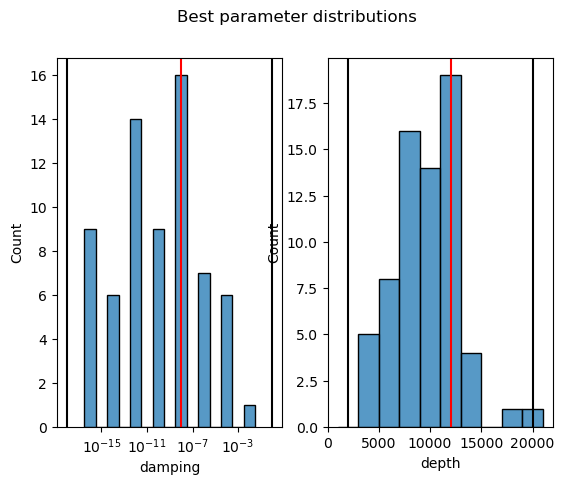

In [45]:
fig, axes = plt.subplots(1,2)
fig.suptitle("Best parameter distributions")
sns.histplot(
    ax=axes[0], 
    data=best_eqs_per_line.damping, 
    log_scale=True,
    bins=dampings,
    discrete=True,
)
axes[0].axvline(dampings.min(), c='k')
axes[0].axvline(dampings.max(), c='k')
axes[0].axvline(best_eqs_per_line.damping.mode()[0], c='r',)

depth_bins = np.append(depths-(depths[1]-depths[0])/2, depths[-1]+(depths[1]-depths[0])/2)
sns.histplot(
    ax=axes[1], 
    data=best_eqs_per_line.depth, 
    bins=depth_bins,
)
axes[1].axvline(depths.min(), c='k')
axes[1].axvline(depths.max(), c='k')
axes[1].axvline(best_eqs_per_line.depth.mode()[0], c='r',)

## Upward continue data 

In [46]:
plot=False

df = rosetta_blocked[rosetta_blocked.line.isin(best_eqs_per_line.line.unique())].copy()
df["up_cont_grav"]=np.nan

lines=[]
up_cont_RMSE=[]
for line in df.line.unique():
    df1 = df[df.line==line].copy()
    eq_fitted = best_eqs_per_line[best_eqs_per_line.line==line].eq_fitted.iloc[0]
    values = eq_fitted.predict(
        (df1.easting, df1.northing, np.ones_like(df1.northing)*1e3))
    df.loc[df.line==line, "up_cont_grav"] = values
    
    if plot is True:
        grav.plot_line_and_crosses(
            df,
            line=line,
            y=["Height", "FAG_levelled", "up_cont_grav"],
        )
    # compare to original gravity
    df["dif"] = df.up_cont_grav - df.FAG_levelled
    lines.append(line)
    up_cont_RMSE.append(utils.RMSE(df[df.line==line].dif))

rosetta_UC = df.copy()

eq_diffs = pd.DataFrame({"line": lines,"up_cont_RMSE": up_cont_RMSE}).sort_values(by="up_cont_RMSE", ascending=False)
eq_diffs

,line,up_cont_RMSE
51,140.0,0.447601
12,790.0,0.345627
3,880.0,0.335745
54,50.0,0.294949
1,900.0,0.233882
...,...,...
60,1070.0,0.070869
25,590.0,0.068340
63,1040.0,0.062291
59,1080.0,0.051803


## Save and load from csv

In [47]:
# rosetta_UC.to_csv(
#     "../data/rosetta_grav_processing.csv.gz",
#     sep=",",
#     na_rep="",
#     header=True,
#     index=False,
#     encoding="utf-8",
#     compression="gzip",
# )
# inters.to_file(
#     "../data/rosetta_grav_processing_intersections.gpkg",
# )

In [93]:
rosetta_UC = pd.read_csv(
    "../data/rosetta_grav_processing.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
inters = gpd.GeoDataFrame.from_file(
    "../data/rosetta_grav_processing_intersections.gpkg",
)
inters

,line1,line2,max_dist,easting,northing,dist_along_line1,dist_along_line2,line1_value,line2_value,mistie_before_UC,geometry
0,50.0,1040.0,36.094627,-218366.620807,-4.903223e+05,75298.725128,28239.022330,-9.918693,-9.918782,0.000089,POINT (-218366.62081 -490322.26644)
1,80.0,1040.0,40.828308,-218370.298672,-5.204792e+05,66357.166666,58395.975851,-6.793537,-6.793551,0.000014,POINT (-218370.29867 -520479.22000)
2,110.0,1040.0,36.542176,-218370.463581,-5.503800e+05,26674.343360,88296.757131,-6.761880,-0.590963,-6.170917,POINT (-218370.46358 -550380.00170)
3,110.0,1050.0,26.504606,-163372.861101,-5.504074e+05,81671.935836,22642.697747,1.281356,-4.889758,6.171114,POINT (-163372.86110 -550407.44105)
4,140.0,1040.0,22.845900,-218372.911205,-5.804105e+05,116398.747036,118327.251046,3.651742,3.311480,0.340261,POINT (-218372.91121 -580410.49556)
...,...,...,...,...,...,...,...,...,...,...,...
421,900.0,1100.0,20.145595,111630.697151,-1.340633e+06,110384.895506,20520.911715,42.199838,35.775701,6.424137,POINT (111630.69715 -1340632.76457)
422,900.0,1120.0,43.162037,221717.580801,-1.340639e+06,298.011709,488765.962690,-49.066601,-16.993501,-32.073100,POINT (221717.58080 -1340638.59959)
423,910.0,1090.0,38.771702,56714.623014,-1.350705e+06,201913.467149,674921.894773,4.573649,4.905069,-0.331420,POINT (56714.62301 -1350705.46036)
424,910.0,1100.0,34.282318,111651.804935,-1.350666e+06,146976.273442,10487.353108,31.084747,33.841529,-2.756782,POINT (111651.80494 -1350666.32264)


In [49]:
# grav.plotly_points(
#     rosetta_UC, 
#     color_col="dif",
#     hover_cols=["FAG_levelled", "up_cont_grav", "dif", "Height", "line"],
#     robust=True,
#     # point_size=5,
# )

In [50]:
# grav.plotly_points(
#     rosetta_UC, 
#     color_col="FAG_levelled",
#     hover_cols=["FAG_levelled", "up_cont_grav", "dif", "Height", "line"],
#     robust=True,
#     # point_size=5,
# )

In [51]:
# grav.plotly_points(
#     rosetta_UC, 
#     color_col="up_cont_grav",
#     hover_cols=["FAG_levelled", "up_cont_grav", "dif", "Height", "line"],
#     robust=True,
#     # point_size=5,
# )

In [52]:
# grav.plot_line_and_crosses(
#     df,
#     line=80,
#     y=["Height", "FAG_levelled", "up_cont_grav",],
# )

## Update the misties

In [94]:
print(f"Previous mistie RMSE: {utils.RMSE(inters.mistie_before_UC)}")
inters, rosetta_UC = grav.calculate_misties(
    inters,
    rosetta_UC,
    data_col = "up_cont_grav",
    mistie_name = "mistie_after_UC",
    # plot=True,
    robust=False,
)
print(f"Updated mistie RMSE: {utils.RMSE(inters.mistie_after_UC)}")
inters.sort_values(by="mistie_after_UC").head()

Previous mistie RMSE: 1.7955902782211852
Updated mistie RMSE: 1.7923495501733457


,line1,line2,max_dist,easting,northing,dist_along_line1,dist_along_line2,line1_value,line2_value,mistie_before_UC,geometry,mistie_after_UC
395,840.0,1100.0,19.731460,111566.267203,-1.280440e+06,252844.408556,80713.444156,-18.461577,19.567095,-39.323652,POINT (111566.26720 -1280440.21806),-38.028672
422,900.0,1120.0,43.162037,221717.580801,-1.340639e+06,298.011709,488765.962690,-47.341207,-16.862255,-32.073100,POINT (221717.58080 -1340638.59959),-30.478952
217,570.0,1140.0,21.841974,331789.980110,-1.010405e+06,878331.819658,164457.167883,-11.100114,5.942075,-16.787859,POINT (331789.98011 -1010404.82335),-17.042190
141,470.0,1120.0,45.784280,221728.989944,-9.105076e+05,34084.659050,58634.994370,0.857549,13.965345,-12.475752,POINT (221728.98994 -910507.63060),-13.107795
138,470.0,1080.0,23.011564,1628.803221,-9.105217e+05,254184.844502,444319.097936,-2.351692,10.212351,-12.605192,POINT (1628.80322 -910521.68594),-12.564042


# Levelling

## 0th order levelling
Apply DC-shifts to all lines to minimize mistie values

calculates least-squares trend through intersection points

In [ ]:
# # level an individual line
# line = 1090
# df1 = grav.verde_predict_trend(
#     inters[inters.line2==line],
#     ["easting", "northing", "mistie_after_UC"],
#     rosetta_UC[rosetta_UC.line==line],
#     ["easting", "northing", "levelling_correction"],
#     degree=1,
# )
# df1['levelled'] = df1.up_cont_grav - df1.levelling_correction

# grav.plot_line_and_crosses(
#     df1, 
#     y=[
#         "up_cont_grav",
#         "levelled",
#         "levelling_correction", 
#         "mistie_after_UC"
#     ],
#     y_axes = [1,1,1,1],
#     plot_inters = [True, False, False, False],
#     marker_sizes=[2,2,2,10]
#     )

In [ ]:
# # level an individual line
# line = 190
# df1 = grav.skl_predict_trend(
#     inters[(inters.line1==line) | (inters.line2==line)],
#     ["dist_along_line1", "mistie_after_UC"],
#     rosetta_UC[rosetta_UC.line==line],
#     ["dist_along_line", "levelling_correction"],
#     degree=1,
# )
# df1['levelled'] = df1.up_cont_grav - df1.levelling_correction

# grav.plot_line_and_crosses(
#     df1, 
#     y=[
#         "up_cont_grav",
#         "levelled",
#         "levelling_correction", 
#         "mistie_after_UC"
#     ],
#     y_axes = [1,1,1,1],
#     plot_inters = [True, False, False, False],
#     marker_sizes=[2,2,2,10]
#     )

In [ ]:
# # level a group of lines
# rosetta_UC, inters = grav.level_lines(
#     inters,
#     rosetta_UC,
#     lines_to_level = rosetta_UC.line[rosetta_UC.line<1000].unique(),
#     cols_to_fit = "dist_along_line1",
#     cols_to_predict = "dist_along_line",
#     degree=0,
#     data_col = "up_cont_grav",
#     mistie_col = "mistie_before_UC",
#     new_mistie_col = "mistie_trend0_1",
#     levelled_col = "levelled",
#     plot=True,
# )

Starting RMSE / mean mistie: 1.7923495501733457 / 0.2982836868855284
RMSE / mean mistie after iteration 1: 1.9654204557624875 / -5.003822082817607e-17
mean correction to lines: 0.27627198987203494 m
RMSE / mean mistie after iteration 2: 1.9654204557624875 / -5.003822082817607e-17
mean correction to lines: -2.0719396886076305e-17 m
RMSE / mean mistie after iteration 3: 1.9654204557624875 / 0.0
mean correction to lines: -3.7903323440857093e-19 m
RMSE / mean mistie after iteration 4: 1.9654204557624875 / 8.339703471362678e-18
mean correction to lines: -3.206501634152924e-17 m
RMSE / mean mistie after iteration 5: 1.9654204557624875 / 8.339703471362678e-18
mean correction to lines: 6.838521054624173e-18 m


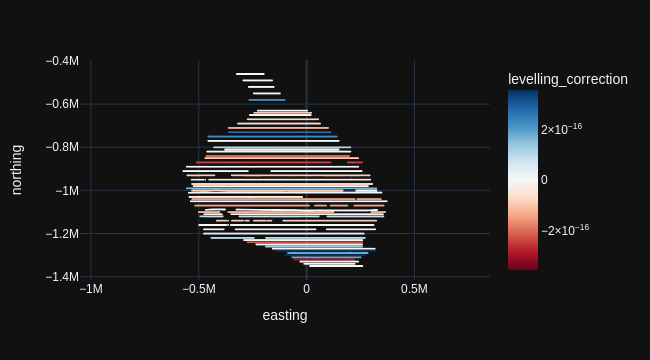

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,...,levelling_correction,mistie_trend0_1,levelled_data_trend0_2,mistie_trend0_2,levelled_data_trend0_3,mistie_trend0_3,levelled_data_trend0_4,mistie_trend0_4,levelled_data_trend0_5,mistie_trend0_5
count,38224.000000,3.822400e+04,38224.000000,37361.000000,37361.000000,3.736100e+04,38224.000000,38224.000000,38224.000000,1704.000000,...,3.050000e+04,8.520000e+02,38224.000000,8.520000e+02,38224.000000,8.520000e+02,38224.000000,8.520000e+02,38224.000000,8.520000e+02
mean,-86500.037660,-1.000913e+06,666.851496,-80.568680,-37.550651,1.457288e+09,793.452463,0.168445,330539.615691,0.284638,...,6.838521e-18,4.169852e-18,-0.025566,1.667941e-17,-0.025566,-4.169852e-18,-0.025566,4.169852e-18,-0.025566,-4.169852e-18
std,212505.665573,1.979502e+05,266.133333,1.783655,165.021108,1.419935e+07,84.755800,13.878295,221055.361999,5.206815,...,1.862805e-16,5.085719e+00,13.668373,5.085719e+00,13.668373,5.085719e+00,13.668373,5.085719e+00,13.668373,5.085719e+00
min,-571732.296606,-1.367282e+06,20.000000,-85.388087,-179.976912,1.447367e+09,650.127900,-285.495226,0.000000,-39.323652,...,-2.960595e-16,-3.897505e+01,-281.693006,-3.897505e+01,-281.693006,-3.897505e+01,-281.693006,-3.897505e+01,-281.693006,-3.897505e+01
25%,-242440.613132,-1.160507e+06,470.000000,-81.858619,-169.887024,1.448316e+09,744.603881,-7.278036,143057.732895,-1.794086,...,-8.881784e-17,-2.222136e+00,-7.295397,-2.222136e+00,-7.295397,-2.222136e+00,-7.295397,-2.222136e+00,-7.295397,-2.222136e+00
50%,-80504.006502,-1.010449e+06,650.000000,-80.377724,-158.362581,1.449134e+09,774.988136,0.239953,302850.372902,0.201308,...,0.000000e+00,-1.019436e-01,-0.007884,-1.019436e-01,-0.007884,-1.019436e-01,-0.007884,-1.019436e-01,-0.007884,-1.019436e-01
75%,75416.555857,-8.504463e+05,850.000000,-79.149725,171.000613,1.479948e+09,820.078925,7.954482,492536.461251,1.797093,...,0.000000e+00,1.666471e+00,7.564206,1.666471e+00,7.564206,1.666471e+00,7.564206,1.666471e+00,7.564206,1.666471e+00
max,371296.853790,-4.604546e+05,1140.000000,-77.342095,179.980497,1.480734e+09,1376.490444,75.640664,908670.925050,40.569202,...,1.184238e-15,3.709055e+01,77.109679,3.709055e+01,77.109679,3.709055e+01,77.109679,3.709055e+01,77.109679,3.709055e+01


In [100]:
# perform iterative levelling, just moving lines to match ties
rosetta_trend0, inters = grav.iterative_line_levelling(
    inters,
    rosetta_UC,
    flight_line_names = rosetta_UC.line[rosetta_UC.line<1000].unique(),
    degree = 0,
    starting_mistie_col = "mistie_after_UC",
    starting_data_col = "up_cont_grav",
    iterations = 5,
    # plot_iterations=True,
    plot_results=True,
)
trend0_final_mistie_col = list(rosetta_trend0.columns)[-1]
trend0_final_data_col = list(rosetta_trend0.columns)[-2]

rosetta_trend0.describe()

In [101]:
trend0_final_mistie_col

'mistie_trend0_5'

In [102]:
trend0_final_data_col

'levelled_data_trend0_5'

Starting RMSE / mean mistie: 1.9654204557624875 / 8.339703471362678e-18
RMSE / mean mistie after iteration 1: 1.7483536977246281 / 2.9188962149769376e-17
mean correction to lines: 0.004037296422467785 m
RMSE / mean mistie after iteration 2: 1.7483536977246283 / -3.3358813885450714e-17
mean correction to lines: 9.323158035314258e-17 m
RMSE / mean mistie after iteration 3: 1.7483536977246283 / 0.0
mean correction to lines: -2.202290457308021e-17 m
RMSE / mean mistie after iteration 4: 1.7483536977246283 / 8.339703471362678e-18
mean correction to lines: 2.9717276197053366e-17 m
RMSE / mean mistie after iteration 5: 1.7483536977246286 / 4.169851735681339e-17
mean correction to lines: -8.9571653513372e-18 m


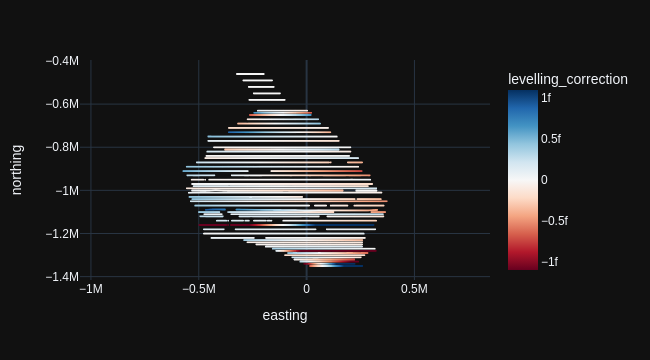

,easting,northing,line,LATITUDE,LONGITUDE,unixtime,Height,FAG_levelled,dist_along_line,mistie_before_UC,...,levelled_data_trend1_1,mistie_trend1_1,levelled_data_trend1_2,mistie_trend1_2,levelled_data_trend1_3,mistie_trend1_3,levelled_data_trend1_4,mistie_trend1_4,levelled_data_trend1_5,mistie_trend1_5
count,38224.000000,3.822400e+04,38224.000000,37361.000000,37361.000000,3.736100e+04,38224.000000,38224.000000,38224.000000,1704.000000,...,38224.000000,8.520000e+02,38224.000000,8.520000e+02,38224.000000,8.520000e+02,38224.000000,8.520000e+02,38224.000000,8.520000e+02
mean,-86500.037660,-1.000913e+06,666.851496,-80.568680,-37.550651,1.457288e+09,793.452463,0.168445,330539.615691,0.284638,...,-0.028788,6.254778e-17,-0.028788,-1.459448e-17,-0.028788,1.876433e-17,-0.028788,-2.293418e-17,-0.028788,1.876433e-17
std,212505.665573,1.979502e+05,266.133333,1.783655,165.021108,1.419935e+07,84.755800,13.878295,221055.361999,5.206815,...,13.829446,4.503674e+00,13.829446,4.503674e+00,13.829446,4.503674e+00,13.829446,4.503674e+00,13.829446,4.503674e+00
min,-571732.296606,-1.367282e+06,20.000000,-85.388087,-179.976912,1.447367e+09,650.127900,-285.495226,0.000000,-39.323652,...,-281.693006,-3.677850e+01,-281.693006,-3.677850e+01,-281.693006,-3.677850e+01,-281.693006,-3.677850e+01,-281.693006,-3.677850e+01
25%,-242440.613132,-1.160507e+06,470.000000,-81.858619,-169.887024,1.448316e+09,744.603881,-7.278036,143057.732895,-1.794086,...,-7.284499,-1.841335e+00,-7.284499,-1.841335e+00,-7.284499,-1.841335e+00,-7.284499,-1.841335e+00,-7.284499,-1.841335e+00
50%,-80504.006502,-1.010449e+06,650.000000,-80.377724,-158.362581,1.449134e+09,774.988136,0.239953,302850.372902,0.201308,...,0.043207,0.000000e+00,0.043207,0.000000e+00,0.043207,0.000000e+00,0.043207,0.000000e+00,0.043207,0.000000e+00
75%,75416.555857,-8.504463e+05,850.000000,-79.149725,171.000613,1.479948e+09,820.078925,7.954482,492536.461251,1.797093,...,7.411268,1.649699e+00,7.411268,1.649699e+00,7.411268,1.649699e+00,7.411268,1.649699e+00,7.411268,1.649699e+00
max,371296.853790,-4.604546e+05,1140.000000,-77.342095,179.980497,1.480734e+09,1376.490444,75.640664,908670.925050,40.569202,...,80.951521,3.253322e+01,80.951521,3.253322e+01,80.951521,3.253322e+01,80.951521,3.253322e+01,80.951521,3.253322e+01


In [105]:
# repeate at a higher order trend
rosetta_trend1, inters = grav.iterative_line_levelling(
    inters,
    rosetta_trend0,
    flight_line_names = rosetta_trend0.line[rosetta_trend0.line<1000].unique(),
    degree = 1,
    starting_mistie_col = trend0_final_mistie_col,
    starting_data_col = trend0_final_data_col,
    iterations = 5,
    # plot_iterations=True,
    plot_results=True,
)
trend1_final_mistie_col = list(rosetta_trend1.columns)[-1]
trend1_final_data_col = list(rosetta_trend1.columns)[-2]

rosetta_trend1.describe() 

In [57]:
# # perform iterative leveling, alternating between flight and tie lines
# rosetta_UC, inters = grav.iterative_levelling_alternate(
#     inters,
#     rosetta_UC,
#     tie_line_names = rosetta_UC.line[rosetta_UC.line>=1000].unique(),
#     flight_line_names = rosetta_UC.line[rosetta_UC.line<1000].unique(),
#     degree = 0,
#     starting_mistie_col = "mistie_after_UC",
#     starting_data_col = "up_cont_grav",
#     iterations = 4,
#     # plot_iterations=True,
#     plot_results=True,
# )
    

In [ ]:
rosetta_UC, inters = grav.level_lines(
    inters,
    rosetta_UC,
    lines_to_level = rosetta_UC.line[rosetta_UC.line>1000].unique(),
    cols_to_fit = "dist_along_line2",
    cols_to_predict = "dist_along_line",
    degree=0,
    data_col = "levelled",
    mistie_col = "mistie_3",
    new_mistie_col = "mistie_4",
    levelled_col = "levelled2",
    plot=True,
)

In [ ]:
rosetta_UC, inters = grav.level_lines(
    inters,
    rosetta_UC,
    lines_to_level = rosetta_UC.line[rosetta_UC.line<1000].unique(),
    cols_to_fit = "dist_along_line1",
    cols_to_predict = "dist_along_line",
    degree=0,
    data_col = "levelled2",
    mistie_col = "mistie_4",
    new_mistie_col = "mistie_5",
    levelled_col = "levelled3",
    plot=True,
)

In [ ]:
# iterate through the E-W lines

rosetta_UC["levelled"]=np.nan

for line in rosetta_UC[rosetta_UC.line<1000].line.unique():
    df = rosetta_UC[rosetta_UC.line==line].copy()

    # fit a polynomial trend through the misties values
    ints = inters[inters.line1==line]
    coords = (ints.geometry.x, ints.geometry.y)
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", message="Under-determined problem") 
        try:
            trend = vd.Trend(degree=0).fit(coords, ints.mistie_2)
            # predict the trend on the line data
            df["trend"] = trend.predict((df.easting, df.northing))
        except ValueError:
            print(f"Issue with line {line}")
            df["trend"] = 0
   
    # remove the trend from the gravity
    values = df.up_cont_grav - df.trend
    
    rosetta_UC.loc[rosetta_UC.line==line, "levelled"] = values
    
for line in rosetta_UC[rosetta_UC.line>=1000].line.unique():
    rosetta_UC.loc[rosetta_UC.line==line, "levelled"] = rosetta_UC.loc[rosetta_UC.line==line, "up_cont_grav"]
    
rosetta_UC["levelling_change"] = rosetta_UC.up_cont_grav - rosetta_UC.levelled  

In [ ]:
print(f"Previous mistie RMSE: {utils.RMSE(inters.mistie_2)}")
inters = grav.calculate_misties(
    inters,
    rosetta_UC,
    data_col = "levelled",
    mistie_name = "mistie_3",
    # plot=True,
    robust=False,
)
inters.sort_values(by="mistie_3")

grav.plotly_points(rosetta_UC, color_col="up_cont_grav", point_size=2)
grav.plotly_points(rosetta_UC, color_col="levelled", point_size=2)
grav.plotly_points(rosetta_UC, color_col="levelling_change", point_size=2)
grav.plotly_points(inters, color_col="mistie_2", point_size=4)
grav.plotly_points(inters, color_col="mistie_3", point_size=4)

In [ ]:
# fit a polynomial trend through the misties
coords = (inters.geometry.x, inters.geometry.y)
trend = vd.Trend(degree=20).fit(coords, inters.mistie_2)

# predict the trend on the intersection points
inters["trend"] = trend.predict(coords)

# remove the trend from the misties
inters["residual"] = inters.mistie_2 - inters.trend

print(utils.RMSE(inters.mistie_2), inters.mistie_2.mean())
print(utils.RMSE(inters.residual), inters.residual.mean())

grav.plotly_points(rosetta_UC,color_col="up_cont_grav", point_size=2)
grav.plotly_points(inters, color_col="mistie_2", point_size=4)
grav.plotly_points(inters, color_col="trend", point_size=4)
grav.plotly_points(inters, color_col="residual", point_size=4)

In [ ]:
# apply correction to the line data

# fit a polynomial trend to the crossover misties
trend = vd.Trend(degree=2).fit(coords, inters.mistie_2)

# predict that trend on the flight line datapoints
rosetta_UC["trend"] = trend.predict((rosetta_UC.easting, rosetta_UC.northing))
                      
# remove the trend from the data
rosetta_UC["levelled"] = rosetta_UC.up_cont_grav - rosetta_UC.trend

grav.plotly_points(
    rosetta_UC,
    color_col="up_cont_grav", 
    point_size=2,
    hover_cols=["up_cont_grav", "levelled", "trend"],
)
grav.plotly_points(
    rosetta_UC,
    color_col="trend", 
    point_size=2,
    hover_cols=["up_cont_grav", "levelled", "trend"],
)
grav.plotly_points(
    rosetta_UC,
    color_col="levelled", 
    point_size=2,
    hover_cols=["up_cont_grav", "levelled", "trend"],
)

In [ ]:
inters.drop(columns=["line1_value", "line2_value"], inplace=True)
inters

In [ ]:
print(f"Previous mistie RMSE: {utils.RMSE(inters.mistie_2)}")
inters = grav.calculate_misties(
    inters,
    rosetta_UC,
    data_col = "levelled",
    mistie_name = "mistie_3",
    plot=True,
    robust=False,
)
inters.sort_values(by="mistie_3")

## 1st order levelling
Tilt lines to minimize misfit values